# Introduction

I use a public dataset Taiwan Air Quality Index Data 2016~2024. The dataset includes information about concentration air pollutants: PM2.5 (fine particulate matter with a diameter of less than 2.5 micrometers), PM10(particulate matter with a diameter less than 10 micrometers), SO2 (Sulfur Dioxide),
NOx(a group of nitrogen oxides (including NO2 and NO)), CO (Carbon Monoxide) and O3(Ozone).
More information on these pollutants can be found [here](https://www.who.int/teams/environment-climate-change-and-health/air-quality-and-health/health-impacts/types-of-pollutants).

For reference click [here](https://www.kaggle.com/datasets/taweilo/taiwan-air-quality-data-20162024).

**The Air Quality Index (AQI)** is calculated using a standardized method that converts measured pollutant concentrations into a uniform index. The formula for calculating the AQI for a specific pollutant is:  

AQI = (C - Bₗ) / (Bₕ - Bₗ) * (Iₕ - Iₗ) + Iₗ

Where:

C: Actual concentration of the pollutant

Bₗ: Concentration value for the lower breakpoint

Bₕ: Concentration value for the higher breakpoint

Iₗ: Index value for the lower breakpoint

Iₕ: Index value for the higher breakpoint

Here, the “standard” value is the national standard for each major pollutant, as specified by the Environmental Protection Agency (EPA) or relevant environmental authorities.

The AQI is then categorized into **six levels** based on health effects:

1. Good (0-50): Air quality is satisfactory, and air pollution poses little or no risk.

2. Moderate (51-100): Air quality is acceptable, but there may be a moderate health concern for a very small number of people who are unusually sensitive to air pollution.

3. Unhealthy for Sensitive Groups (101-150): Members of sensitive groups may experience health effects. The general public is not likely to be affected.

4. Unhealthy (151-200): Everyone may begin to experience health effects; members of sensitive groups may experience more serious health effects.

5. Very Unhealthy (201-300): Health warnings of emergency conditions. The entire population is more likely to be affected.

6. Hazardous (300+): Health warnings of emergency conditions. The entire population is more likely to be affected.


# Import libraries

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy.stats as sps
# make plots bigger 
from pylab import rcParams
rcParams["figure.figsize"] = 15, 7
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error, mean_absolute_error

#models
from prophet import Prophet
from etna.datasets.tsdataset import TSDataset
from etna.models import CatBoostMultiSegmentModel
#analysis
from etna.analysis import plot_forecast, plot_backtest, plot_feature_relevance, ModelRelevanceTable, acf_plot, stl_plot
from statsmodels.graphics.tsaplots import plot_acf
from etna.metrics import MAPE, SMAPE

from etna.transforms import MeanTransform, LagTransform
%config InlineBackend.figure_format = "retina"

In [2]:
import warnings
import itertools
warnings.filterwarnings("ignore") # specify to ignore warning messages

# Data preparation

In [3]:
df = pd.read_csv("air_quality.csv")
df.head()

,date,sitename,county,aqi,pollutant,status,so2,co,o3,o3_8hr,...,windspeed,winddirec,unit,co_8hr,pm2.5_avg,pm10_avg,so2_avg,longitude,latitude,siteid
0,2024-08-31 23:00,Hukou,Hsinchu County,62.0,PM2.5,Moderate,0.9,0.17,35.0,40.2,...,2.3,225,NaN,0.2,20.1,26.0,1.0,121.038869,24.900097,22.0
1,2024-08-31 23:00,Zhongming,Taichung City,50.0,NaN,Good,1.6,0.32,27.9,35.1,...,1.1,184,NaN,0.2,15.3,23.0,1.0,120.641092,24.151958,31.0
2,2024-08-31 23:00,Zhudong,Hsinchu County,45.0,NaN,Good,0.4,0.17,25.1,40.6,...,0.4,210,NaN,0.2,13.8,24.0,0.0,121.088955,24.740914,23.0
3,2024-08-31 23:00,Hsinchu,Hsinchu City,42.0,NaN,Good,0.8,0.2,30.0,35.9,...,1.9,239,NaN,0.2,13.0,26.0,1.0,120.972368,24.805636,24.0
4,2024-08-31 23:00,Toufen,Miaoli County,50.0,NaN,Good,1.0,0.16,33.5,35.9,...,1.8,259,NaN,0.1,15.3,28.0,1.0,120.898693,24.696907,25.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5882208 entries, 0 to 5882207
Data columns (total 25 columns):
 #   Column     Dtype  
---  ------     -----  
 0   date       object 
 1   sitename   object 
 2   county     object 
 3   aqi        float64
 4   pollutant  object 
 5   status     object 
 6   so2        object 
 7   co         object 
 8   o3         object 
 9   o3_8hr     object 
 10  pm10       object 
 11  pm2.5      object 
 12  no2        object 
 13  nox        object 
 14  no         object 
 15  windspeed  object 
 16  winddirec  object 
 17  unit       float64
 18  co_8hr     object 
 19  pm2.5_avg  object 
 20  pm10_avg   object 
 21  so2_avg    object 
 22  longitude  float64
 23  latitude   float64
 24  siteid     float64
dtypes: float64(5), object(20)
memory usage: 1.1+ GB


In [5]:
# descriptive statistics include the categorical columns in the dataset 
df.describe(include='object').T

,count,unique,top,freq
date,5882208,67641,2022-03-03 02:00,168
sitename,5882208,123,Yangming,72180
county,5882208,22,New Taipei City,898819
pollutant,2647196,7,PM2.5,2296437
status,5739490,6,Good,3185191
so2,5742440.0,873.0,1.3,231312.0
co,5768704,1408,0.21,91799
o3,5757191,2740,-,82409
o3_8hr,5751127.0,2036.0,30.0,66458.0
pm10,5741850.0,1120.0,21.0,165259.0


The AQI as explained above is based on these pollutants and for our notebook we will only deal with AQI values across the country.

In [6]:
df_aqi = df[["county","date", "aqi"]]

In [7]:
df_aqi.county.unique()

array(['Hsinchu County', 'Taichung City', 'Hsinchu City', 'Miaoli County',
       'Taoyuan City', 'Changhua County', 'Nantou County',
       'Yunlin County', 'Chiayi County', 'Tainan City', 'New Taipei City',
       'Pingtung County', 'Keelung City', 'Taipei City', 'Chiayi City',
       'Yilan County', 'Kaohsiung City', 'Lienchiang County',
       'Penghu County', 'Taitung County', 'Kinmen County',
       'Hualien County'], dtype=object)

In [8]:
df_aqi["county"]=df_aqi["county"].apply(lambda row: row.split()[0])

In [9]:
df_aqi.head()

,county,date,aqi
0,Hsinchu,2024-08-31 23:00,62.0
1,Taichung,2024-08-31 23:00,50.0
2,Hsinchu,2024-08-31 23:00,45.0
3,Hsinchu,2024-08-31 23:00,42.0
4,Miaoli,2024-08-31 23:00,50.0


In [10]:
min_date = df_aqi['date'].min()
max_date = df_aqi['date'].max()

print(f"Date Range: {min_date} to {max_date}")

Date Range: 2016-11-25 13:00 to 2024-08-31 23:00


In [11]:
cities = pd.unique(df_aqi['county'])
# Generate column names for AQI (no bucket column)
column1 = cities + '_AQI'
columns = column1

# Define the date range for the DataFrame index
final_df = pd.DataFrame(index=pd.date_range('2016-11-25', '2024-08-31', freq='H'), columns=columns)

# Populate the DataFrame with AQI values
for city in cities:
    # Filter the original DataFrame for the current city
    city_aqi = np.array(df_aqi[df_aqi['county'] == city]['aqi'])
    city_dates = pd.to_datetime(df_aqi[df_aqi['county'] == city]['date'])
    
    # Match the AQI values with the corresponding dates
    for date, aqi in zip(city_dates, city_aqi):
        if date in final_df.index:
            final_df.loc[date, f'{city}_AQI'] = aqi

final_df.head()


,Hsinchu_AQI,Taichung_AQI,Miaoli_AQI,Taoyuan_AQI,Changhua_AQI,Nantou_AQI,Yunlin_AQI,Chiayi_AQI,Tainan_AQI,New_AQI,Pingtung_AQI,Keelung_AQI,Taipei_AQI,Yilan_AQI,Kaohsiung_AQI,Lienchiang_AQI,Penghu_AQI,Taitung_AQI,Kinmen_AQI,Hualien_AQI
2016-11-25 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-25 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-25 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-25 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-25 04:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
# missing values
(final_df.isna().sum()/len(final_df))*100

Hsinchu_AQI       1.397194
Taichung_AQI      1.219423
Miaoli_AQI        1.704253
Taoyuan_AQI       1.497098
Changhua_AQI      1.998090
Nantou_AQI        1.423639
Yunlin_AQI        1.505913
Chiayi_AQI        1.109234
Tainan_AQI        1.492691
New_AQI           1.442739
Pingtung_AQI      2.178800
Keelung_AQI       1.508852
Taipei_AQI        1.644017
Yilan_AQI         1.301697
Kaohsiung_AQI     1.461838
Lienchiang_AQI    1.140087
Penghu_AQI        1.516198
Taitung_AQI       1.614633
Kinmen_AQI        1.389848
Hualien_AQI       1.120987
dtype: float64

In [13]:
final_df.dropna()

,Hsinchu_AQI,Taichung_AQI,Miaoli_AQI,Taoyuan_AQI,Changhua_AQI,Nantou_AQI,Yunlin_AQI,Chiayi_AQI,Tainan_AQI,New_AQI,Pingtung_AQI,Keelung_AQI,Taipei_AQI,Yilan_AQI,Kaohsiung_AQI,Lienchiang_AQI,Penghu_AQI,Taitung_AQI,Kinmen_AQI,Hualien_AQI
2016-11-25 13:00:00,25.0,24.0,19.0,25.0,25.0,59.0,42.0,62.0,59.0,26.0,84.0,30.0,31.0,27.0,84.0,69.0,36.0,26.0,42.0,17.0
2016-11-25 14:00:00,30.0,30.0,25.0,26.0,26.0,57.0,49.0,39.0,52.0,23.0,87.0,30.0,26.0,24.0,99.0,69.0,36.0,26.0,42.0,21.0
2016-11-25 15:00:00,26.0,34.0,26.0,25.0,30.0,57.0,49.0,42.0,42.0,25.0,97.0,30.0,27.0,27.0,92.0,69.0,36.0,24.0,45.0,25.0
2016-11-25 16:00:00,31.0,37.0,29.0,27.0,36.0,59.0,48.0,67.0,59.0,35.0,94.0,30.0,27.0,27.0,82.0,69.0,36.0,26.0,45.0,29.0
2016-11-25 17:00:00,31.0,44.0,36.0,25.0,38.0,59.0,49.0,49.0,59.0,24.0,108.0,31.0,26.0,25.0,99.0,72.0,36.0,27.0,45.0,31.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-08-30 20:00:00,49.0,47.0,59.0,61.0,58.0,67.0,67.0,44.0,37.0,64.0,28.0,53.0,53.0,37.0,37.0,84.0,43.0,21.0,47.0,25.0
2024-08-30 21:00:00,63.0,63.0,61.0,63.0,62.0,84.0,60.0,61.0,38.0,56.0,27.0,53.0,77.0,35.0,28.0,80.0,44.0,24.0,51.0,25.0
2024-08-30 22:00:00,64.0,64.0,63.0,65.0,63.0,67.0,60.0,60.0,38.0,55.0,51.0,51.0,44.0,36.0,20.0,80.0,44.0,22.0,52.0,26.0
2024-08-30 23:00:00,64.0,63.0,63.0,65.0,65.0,64.0,60.0,60.0,41.0,51.0,29.0,46.0,41.0,37.0,26.0,77.0,44.0,20.0,54.0,26.0


In [14]:
print(f'number of missing values:{final_df.isna().sum().sum()}')

number of missing values:20193


In [15]:
final_df['Taiwan_AQI']=final_df.mean(axis=1)

# EDA

In [16]:
Taiwan_AQI = final_df["Taiwan_AQI"].apply(lambda x: np.nan if x < 0 else x)
Taiwan_AQI = Taiwan_AQI.reset_index()
Taiwan_AQI.columns = ["datetime", "AQI_value"]
Taiwan_AQI=Taiwan_AQI.dropna(subset=['AQI_value'])

In [17]:
Taiwan_AQI.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67568 entries, 13 to 68064
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   datetime   67568 non-null  datetime64[ns]
 1   AQI_value  67568 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 1.5 MB


In [18]:
df_new =Taiwan_AQI.resample('H', on='datetime').mean()

In [19]:
from pandas.api.types import CategoricalDtype

cat_type = CategoricalDtype(categories=['Monday','Tuesday',
                                        'Wednesday',
                                        'Thursday','Friday',
                                        'Saturday','Sunday'],
                            ordered=True)

def create_features(df, label=None):
    """
    Creates time series features from datetime index.
    """
    df = df.copy()
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['weekday'] = df['date'].dt.day_name()
    df['weekday'] = df['weekday'].astype(cat_type)
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    df['date_offset'] = (df.date.dt.month*100 + df.date.dt.day - 320)%1300

    df['season'] = pd.cut(df['date_offset'], [0, 300, 602, 900, 1300], 
                          labels=['Spring', 'Summer', 'Fall', 'Winter']
                   )
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear','weekday',
           'season']]
    if label:
        y = df[label]
        return X, y
    return X

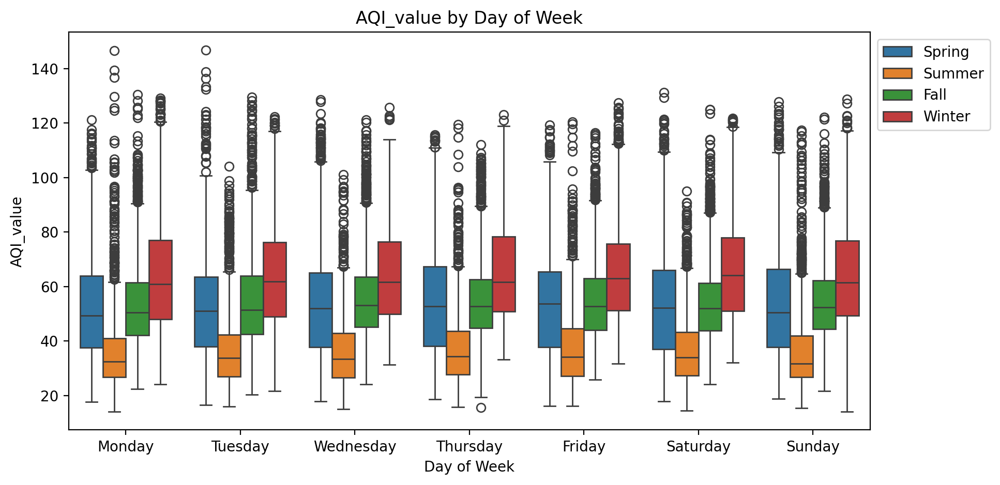

In [20]:
X, y = create_features(df_new, label='AQI_value')
features_and_target = pd.concat([X, y], axis=1)

features_and_target

fig, ax = plt.subplots(figsize=(10, 5))
sns.boxplot(data=features_and_target.dropna(),
            x='weekday',
            y='AQI_value',
            hue='season',
            ax=ax,
            linewidth=1)
ax.set_title('AQI_value by Day of Week')
ax.set_xlabel('Day of Week')
ax.set_ylabel('AQI_value')
ax.legend(bbox_to_anchor=(1, 1))
plt.show()

So, we can see that our day of the week feature does seem to play importance into our predictions, hovewer the season is very important. We have peaks in the Winter (highest concentration of air pollutant) and the lower level in the Summer.

In [21]:
# Ientify and handle outliers
Q1 = Taiwan_AQI['AQI_value'].quantile(0.25)
Q3 = Taiwan_AQI['AQI_value'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = Taiwan_AQI[(Taiwan_AQI['AQI_value'] < lower_bound) | (Taiwan_AQI['AQI_value'] > upper_bound)]

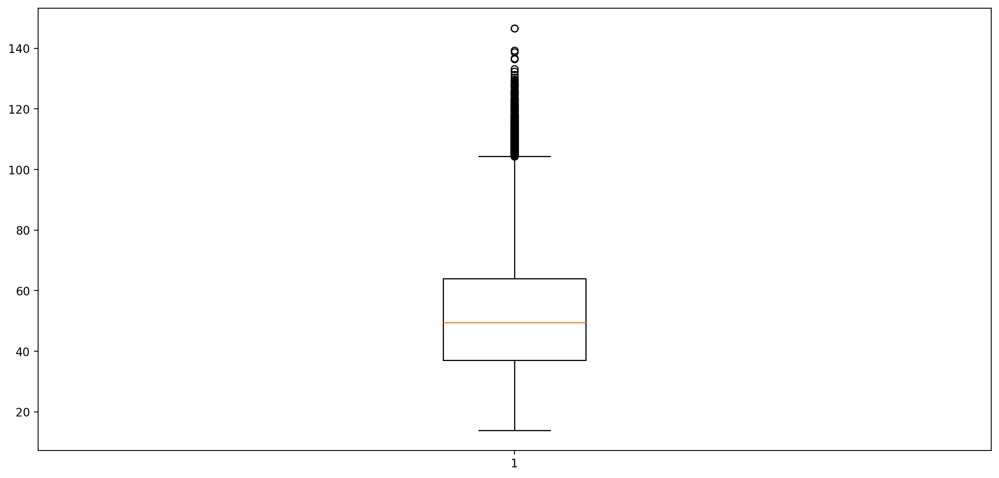

In [22]:
plt.boxplot( Taiwan_AQI['AQI_value'])
plt.show()

In [23]:
Taiwan_AQI['AQI_value'] = Taiwan_AQI['AQI_value'].mask((Taiwan_AQI['AQI_value'] > upper_bound) | (Taiwan_AQI['AQI_value'] < lower_bound)).interpolate()

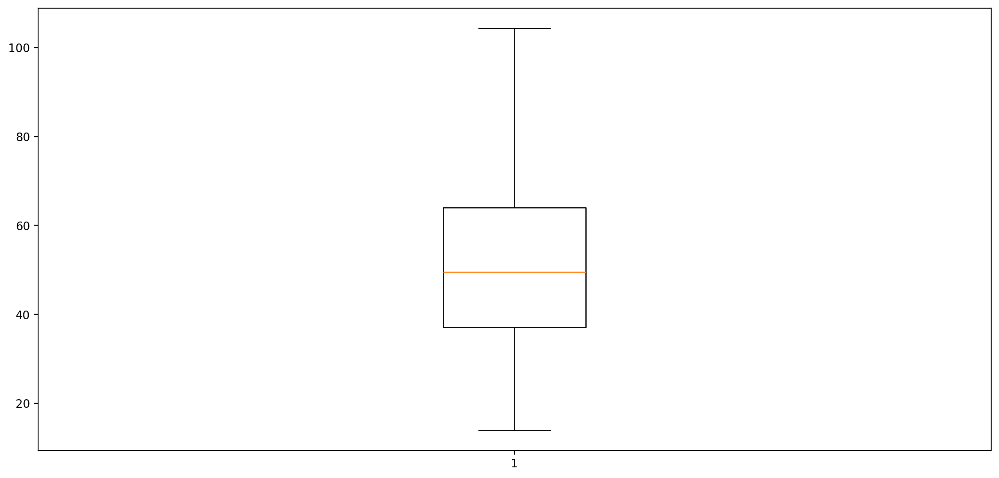

In [24]:
plt.boxplot( Taiwan_AQI['AQI_value'])
plt.show()

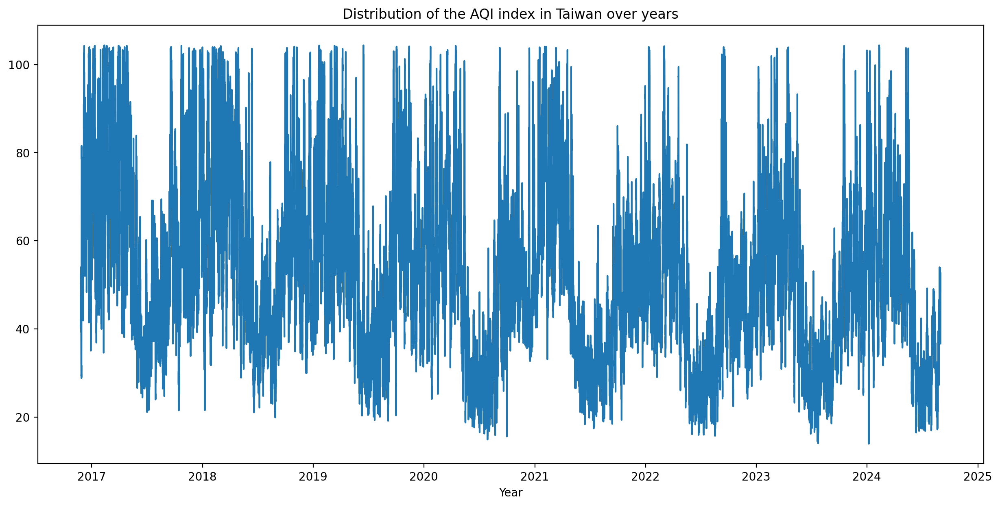

In [25]:
fig, ax = plt.subplots()
plt.plot(Taiwan_AQI.set_index("datetime"))
ax.set_xlabel('Year')
ax.set_title('Distribution of the AQI index in Taiwan over years')
plt.show()

The following conclusions can be drawn from the graph: 
1. Clear Seasonality
The AQI exhibits periodic spikes and dips, indicating a strong seasonal pattern.
2. Yearly Repetition
The pattern is consistent across years, suggesting that the causes of AQI fluctuations (e.g., seasonal weather, human activities) remain similar over time.
3. Gradual Trend
There doesn’t appear to be a significant long-term increasing or decreasing trend in AQI levels over the observed years. The peaks and troughs are relatively stable in magnitude across the timeline.

In [26]:
px.line(Taiwan_AQI.set_index("datetime"))

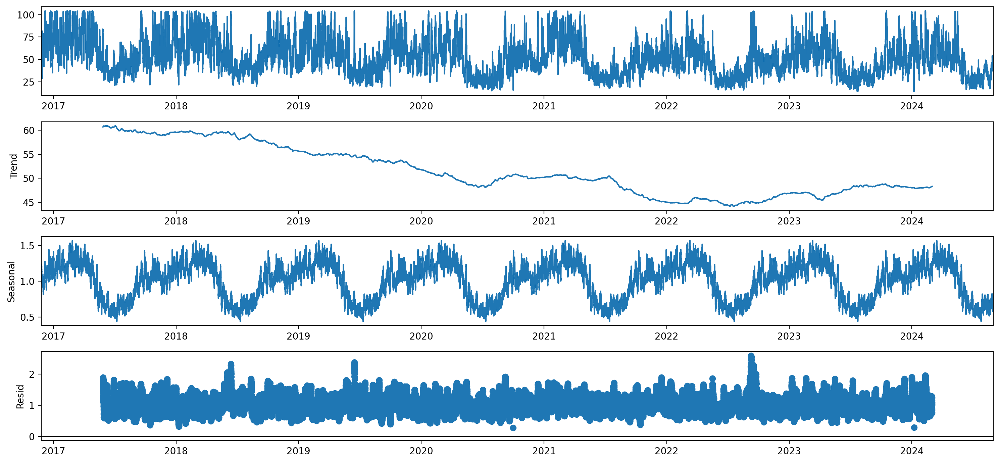

In [27]:
# the seasonal decompose of the AQI values 
decompose = sm.tsa.seasonal_decompose(Taiwan_AQI.set_index("datetime"), model="multiplicative", period = 1*24*365)
fig = decompose.plot()


**The trend** shows the long-term movement in the AQI data. In this case, the trend appears to be slightly declining from 2017 to 2022 but stabilizes towards the end of the observed period. This might indicate improving air quality over time or a change in external factors affecting AQI.
As we indicated earlier, the AQI index exhibits **strong seasonal dynamics**, with fluctuations recurring approximately every year. This may be due to environmental factors such as weather conditions, industrial activity or other recurring events.


In [28]:
#Test stationary using Dickey-Fuller
#The null hypothesis for the test is that the time series is non-stationary. The test results compare a Test Statistic and Critical Values (cutoff value) at different confidence levels.
#If the ‘Test Statistic’ is less than the ‘Critical Value’, we can reject the null hypothesis and say that the series is stationary. 
#This technique will be handled by the TestStationaryAdfuller( )
#Let's confirm that our time series is stationary
aqi_values = Taiwan_AQI['AQI_value']
from statsmodels.tsa.stattools import  adfuller
def TestStationaryAdfuller(ts, cutoff = 0.01):
    ts_test = adfuller(ts, autolag = 'AIC')
    ts_test_output = pd.Series(ts_test[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    
    for key,value in ts_test[4].items():
        ts_test_output['Critical Value (%s)'%key] = value
    print(ts_test_output)
    
    if ts_test[1] <= cutoff:
        print("Strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root, hence it is stationary")
    else:
        print("Weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")

In [29]:
TestStationaryAdfuller(aqi_values)

Test Statistic                -1.251381e+01
p-value                        2.638461e-23
#Lags Used                     6.200000e+01
Number of Observations Used    6.750500e+04
Critical Value (1%)           -3.430447e+00
Critical Value (5%)           -2.861583e+00
Critical Value (10%)          -2.566793e+00
dtype: float64
Strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root, hence it is stationary


In [30]:
test_size = 8760 # values are collected every hour, so 1 year = 24*365
data_train = Taiwan_AQI.iloc[:-test_size]
data_test =  Taiwan_AQI.iloc[-test_size:]

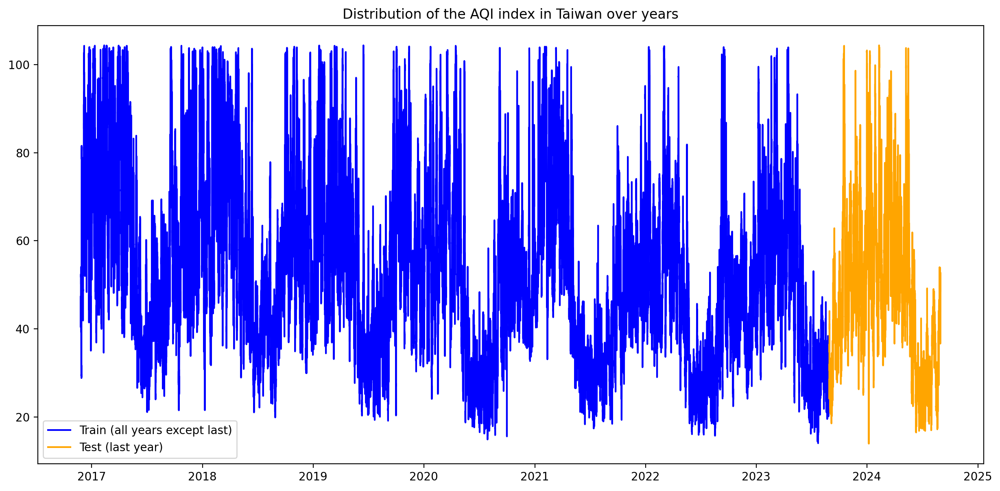

In [31]:
plt.title("Distribution of the AQI index in Taiwan over years")
plt.plot(data_train['datetime'], data_train['AQI_value'], label="Train (all years except last)", color="blue")
plt.plot(data_test['datetime'], data_test['AQI_value'], label="Test (last year)", color="orange")
plt.legend();

# Forecasting

Since we observe clear seasonal patterns and a gradual trend for predicting Aqi value for the next year I will use **Prophet** and **ETNA library**.

# Evaluation: Model Quality Metrics 

In [32]:
# Let's define a function that will calculate the quality metrics of the models and record them in a table. 
#In the future we will select the best model and predict the AQI level for the year 2025
compare_table = None
def add_result_in_comprasion_table(method: str, y_true, y_forecast) -> pd.DataFrame:
    global compare_table
    result_now ={
            'method': method,
            'MSE':mean_squared_error(y_true = y_true, y_pred=y_forecast),
            'MAE': mean_absolute_error(y_true = y_true, y_pred=y_forecast),
            'MAPE': mean_absolute_percentage_error(y_true = y_true, y_pred=y_forecast)
    }
    if compare_table is None:
        compare_table = pd.DataFrame([result_now])
    else:
        if method in list(compare_table["method"]):
            compare_table=compare_table[compare_table["method"] != method]
        compare_table = pd.concat([compare_table, pd.DataFrame([result_now])])
        compare_table.index = np.arange(len(compare_table))
    return compare_table

def  mean_absolute_percentage_error(y_true , y_pred) -> float:
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true-y_pred)/y_true))*100

In [33]:
def plot_result(y_to_train, y_to_test, y_forecast, plot_conf_int =True, left_bound=None, right_bound = None):
    plt.figure(figsize=(15, 7))
    plt.title("Distribution of the AQI index in Taiwan over years")
    plt.plot(y_to_train, label="Train", color="blue")
    plt.plot(y_to_test, label="Test", color="orange")
    plt.plot(y_to_test.index, y_forecast, label="Prediction")
    if plot_conf_int:
        plt.fill_between(y_to_test.index, left_bound, right_bound, alpha=0.3, color="grey",label="con.int")
    plt.legend()
    plt.show()
    

# Prophet 

The training model takes a two-column dataset as input:
ds - date
y - time series
Let's prepare our data so that we can pass it to the model 

In [34]:
prophet_train_df = pd.DataFrame(data_train).set_index("datetime")
prophet_train_df.columns=["y"]
prophet_train_df["ds"]= prophet_train_df.index

In [35]:
prophet_train_df.head()

,y,ds
datetime,,
2016-11-25 13:00:00,40.60,2016-11-25 13:00:00
2016-11-25 14:00:00,40.85,2016-11-25 14:00:00
2016-11-25 15:00:00,41.40,2016-11-25 15:00:00
2016-11-25 16:00:00,44.65,2016-11-25 16:00:00
2016-11-25 17:00:00,45.70,2016-11-25 17:00:00


In [36]:
prophet_model=Prophet(interval_width=0.95, yearly_seasonality=True, changepoint_prior_scale=0.01)
prophet_model.fit(prophet_train_df)

18:42:59 - cmdstanpy - INFO - Chain [1] start processing
18:43:07 - cmdstanpy - INFO - Chain [1] done processing


In [37]:
future = prophet_model.make_future_dataframe(periods=8760, freq='H')
prophet_forecast=prophet_model.predict(future)
forecast_test = prophet_forecast.loc[prophet_forecast['ds'].isin(data_test['datetime'])]

In [38]:
prophet_forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2016-11-25 13:00:00,63.282014,37.756263,88.483748,63.282014,63.282014,-1.009821,-1.009821,-1.009821,-0.119815,...,0.153526,0.153526,0.153526,-1.043531,-1.043531,-1.043531,0.0,0.0,0.0,62.272193
1,2016-11-25 14:00:00,63.281543,38.398070,89.606241,63.281543,63.281543,-0.491310,-0.491310,-0.491310,0.423735,...,0.141252,0.141252,0.141252,-1.056298,-1.056298,-1.056298,0.0,0.0,0.0,62.790232
2,2016-11-25 15:00:00,63.281071,38.246373,90.073489,63.281071,63.281071,0.396816,0.396816,0.396816,1.334011,...,0.131742,0.131742,0.131742,-1.068938,-1.068938,-1.068938,0.0,0.0,0.0,63.677887
3,2016-11-25 16:00:00,63.280600,38.841525,93.709112,63.280600,63.280600,1.550581,1.550581,1.550581,2.506941,...,0.125092,0.125092,0.125092,-1.081452,-1.081452,-1.081452,0.0,0.0,0.0,64.831181
4,2016-11-25 17:00:00,63.280129,39.799956,91.613755,63.280129,63.280129,2.596919,2.596919,2.596919,3.569402,...,0.121356,0.121356,0.121356,-1.093839,-1.093839,-1.093839,0.0,0.0,0.0,65.877048


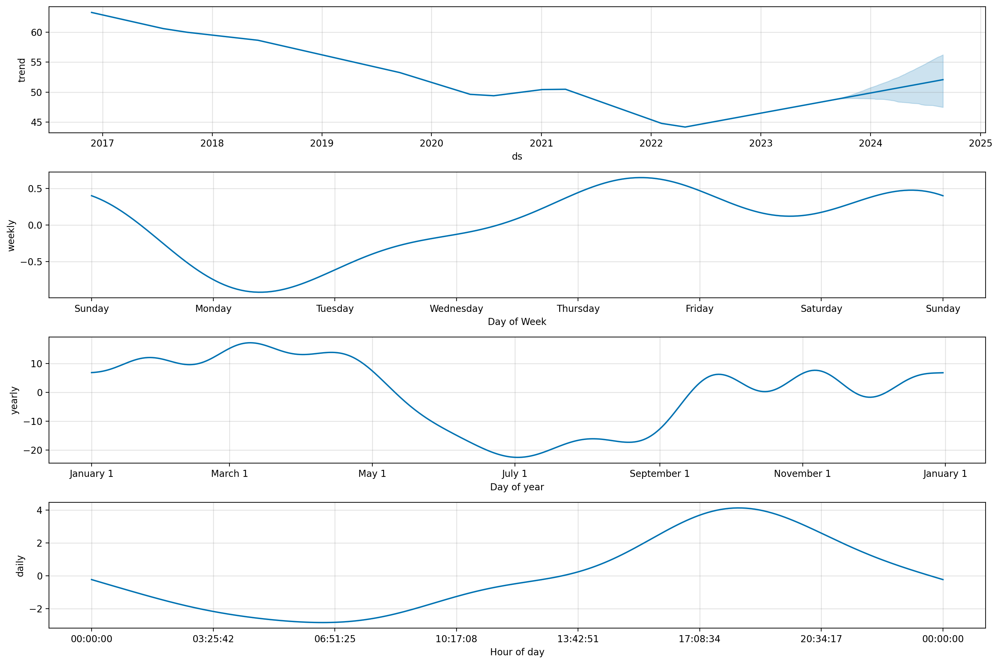

In [39]:
prophet_model.plot_components(prophet_forecast, figsize=(15,10))
plt.show()

In [40]:
forecast_test = prophet_forecast.loc[prophet_forecast['ds'].between(data_test['datetime'].iloc[0], data_test['datetime'].iloc[-1])]
print(data_train['AQI_value'].shape, data_test['AQI_value'].shape, forecast_test["yhat"].shape)

(58808,) (8760,) (8760,)


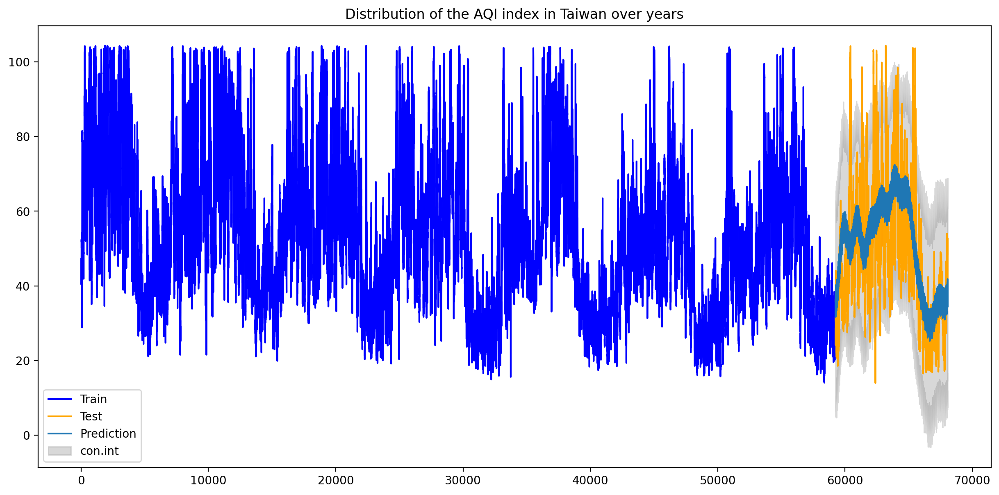

In [41]:
plot_result( data_train['AQI_value'], data_test['AQI_value'],forecast_test["yhat"], plot_conf_int=True,
             left_bound=prophet_forecast["yhat_lower"].iloc[-8760:].values, right_bound=prophet_forecast["yhat_upper"].iloc[-8760:].values )

In [42]:
y_true_prophet = data_test['AQI_value']
y_forecast_prophet = forecast_test['yhat']
add_result_in_comprasion_table("Prophet", y_true_prophet, y_forecast_prophet )

,method,MSE,MAE,MAPE
0,Prophet,192.482273,10.810493,24.549244


In [43]:
data_daily = Taiwan_AQI.resample('D', on='datetime').mean().reset_index()

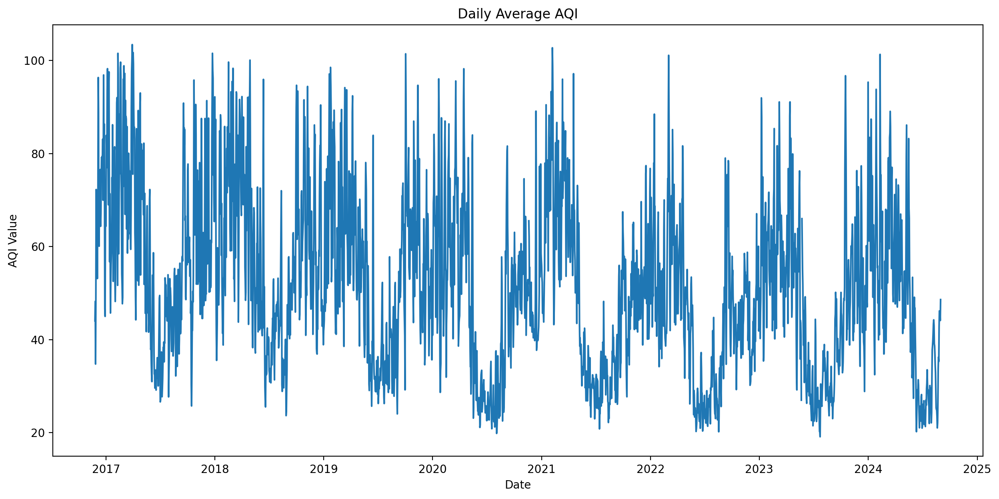

In [44]:
plt.plot(data_daily['datetime'], data_daily['AQI_value'])
plt.title('Daily Average AQI')
plt.xlabel('Date')
plt.ylabel('AQI Value')
plt.show()

In [45]:
prophet_data_daily = data_daily.rename(columns={'datetime': 'ds', 'AQI_value': 'y'})

In [46]:
split_date = prophet_data_daily['ds'].max() - pd.Timedelta(days=365)
# Split into training and test sets
prophet_train_daily =prophet_data_daily[prophet_data_daily['ds'] <= split_date]
prophet_test_daily = prophet_data_daily[prophet_data_daily['ds'] > split_date]

In [47]:
prophet_model = Prophet()
prophet_model.fit(prophet_train_daily)

# Generate future predictions for the test period
future_daily = prophet_model.make_future_dataframe(periods=len(prophet_test_daily), freq='D')
forecast_daily = prophet_model.predict(future_daily)

18:43:21 - cmdstanpy - INFO - Chain [1] start processing
18:43:22 - cmdstanpy - INFO - Chain [1] done processing


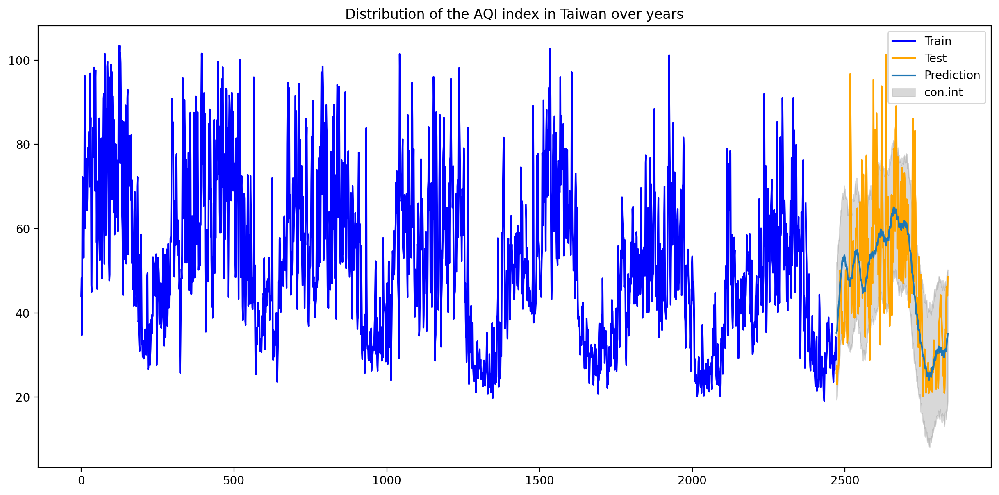

In [48]:
forecast_test_daily = forecast_daily[forecast_daily['ds'].isin(prophet_test_daily['ds'])]
plot_result( prophet_train_daily['y'], prophet_test_daily['y'],forecast_test_daily["yhat"], plot_conf_int=True,
             left_bound=forecast_test_daily["yhat_lower"], right_bound=forecast_test_daily["yhat_upper"] )

In [49]:
y_true_prophet_daily = prophet_test_daily['y']
y_forecast_prophet_daily =forecast_test_daily["yhat"]
add_result_in_comprasion_table("Prophet_daily", y_true_prophet_daily, y_forecast_prophet_daily )

,method,MSE,MAE,MAPE
0,Prophet,192.482273,10.810493,24.549244
1,Prophet_daily,159.689908,9.504567,19.627456


# ETNA

In [50]:
#  Prepare our data so that we can pass it to the model
df_new =  Taiwan_AQI.resample('MS', on='datetime').mean().reset_index()
df_new.dropna(subset=['AQI_value'], inplace=True)
df_new.drop_duplicates(inplace=True)
df_new["timestamp"] = pd.to_datetime(df_new["datetime"])
df_new["target"]= df_new["AQI_value"]
df_new.drop(columns=["datetime", "AQI_value"], inplace=True)
df_new["segment"]="main"
df_new.head()

,timestamp,target,segment
0,2016-11-01,49.851472,main
1,2016-12-01,71.628600,main
2,2017-01-01,71.845954,main
3,2017-02-01,74.047131,main
4,2017-03-01,78.989421,main


In [51]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 94 entries, 0 to 93
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timestamp  94 non-null     datetime64[ns]
 1   target     94 non-null     float64       
 2   segment    94 non-null     object        
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 2.9+ KB


In [52]:
df_etna_new = TSDataset.to_dataset(df_new)
ts=TSDataset(df_etna_new, freq="MS")

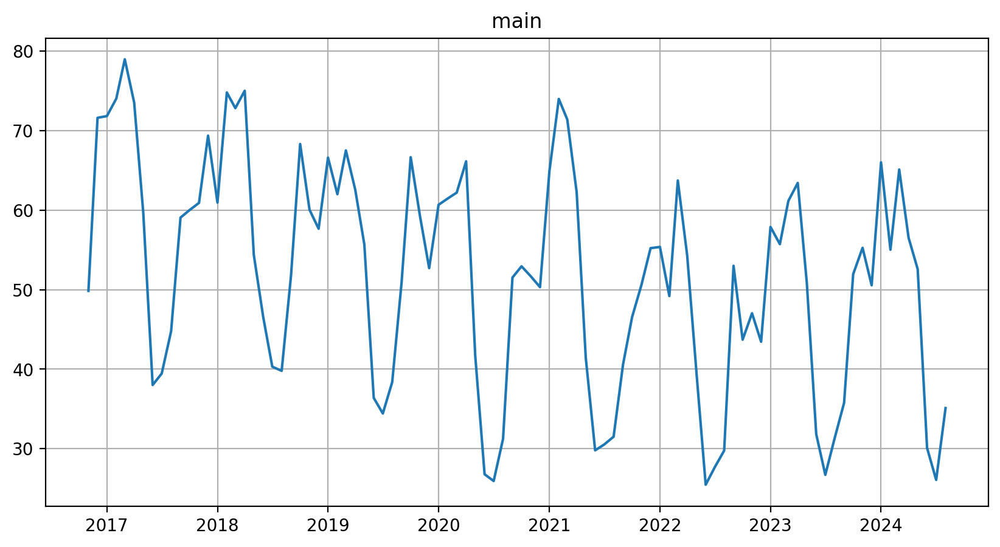

In [53]:
ts.plot()

In [54]:
ts.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
main,2016-11-01,2024-08-01,94,0,1,0,0,0,MS


In [55]:
train_ts, test_ts = ts.train_test_split(train_start ="2016-11-01",
                                        train_end = "2023-10-01",
                                        test_start="2023-11-01",
                                        test_end="2024-08-31")

In [56]:
HORIZON = 10

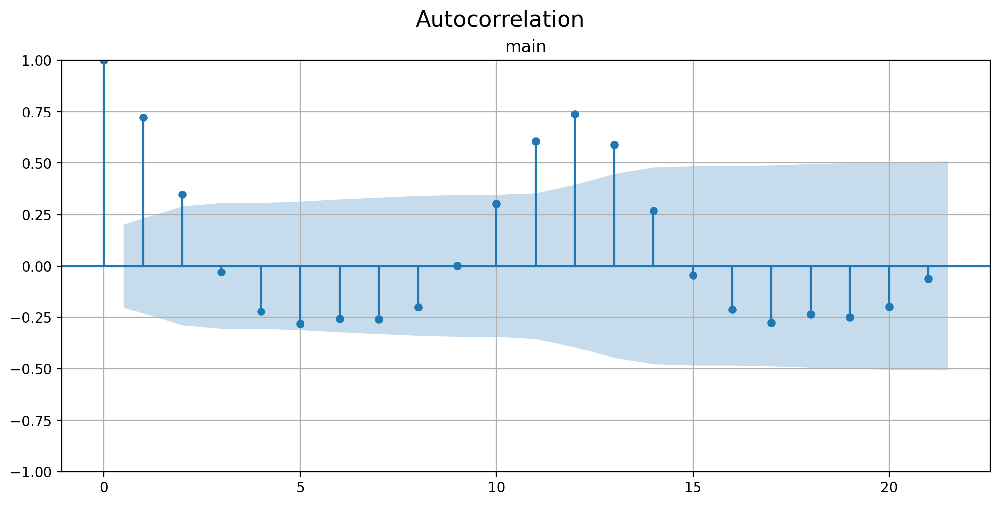

In [57]:
acf_plot(ts, lags =21)

# SeasonalMovingAverageModel

In [58]:
from etna.models import SeasonalMovingAverageModel
model_smam = SeasonalMovingAverageModel(window=5, seasonality=True)
model_smam.fit(train_ts)
future_ts = train_ts.make_future(future_steps=HORIZON, tail_steps=model_smam.context_size)
forecast_ts = model_smam.forecast(future_ts, prediction_size=HORIZON)
forecast_ts

segment,main
feature,target
timestamp,
2023-11-01,35.518214
2023-12-01,36.257937
2024-01-01,38.167833
2024-02-01,39.532883
2024-03-01,40.286873
2024-04-01,37.952748
2024-05-01,38.439655
2024-06-01,38.875998


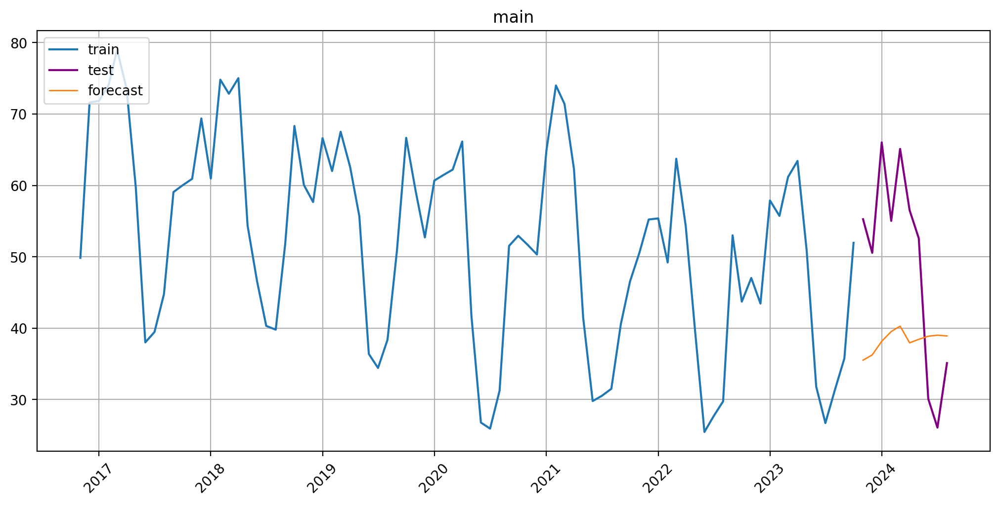

In [59]:
plot_forecast(forecast_ts,test_ts, train_ts)

#  SARIMAXModel

In [60]:
from etna.models import SARIMAXModel
model_sarima = SARIMAXModel(order=(1,1,1), seasonal_order=(1,0,1,12))
model_sarima.fit(train_ts)
future_ts_sarima = train_ts.make_future(HORIZON)
forecast_ts_sarima = model_sarima.forecast(future_ts_sarima)
forecast_ts_sarima

segment,main
feature,target
timestamp,
2023-11-01,46.079618
2023-12-01,47.917259
2024-01-01,53.051390
2024-02-01,54.655609
2024-03-01,58.376677
2024-04-01,55.536583
2024-05-01,39.974132
2024-06-01,25.037440


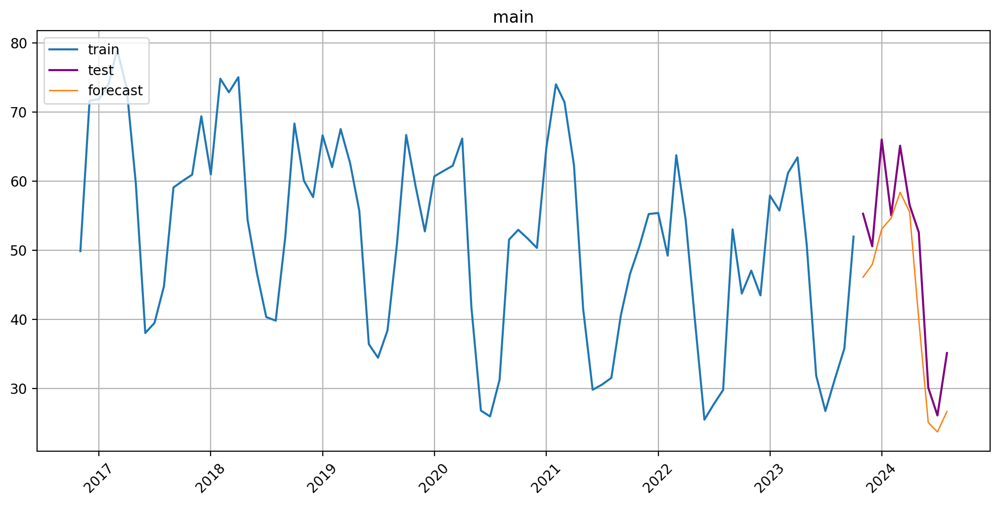

In [61]:
plot_forecast(forecast_ts_sarima,test_ts, train_ts)

In [62]:
mape = MAPE()
mape(y_true = test_ts, y_pred=forecast_ts_sarima)

{'main': 12.83170371215802}

In [63]:
smape = SMAPE()
smape(y_true = test_ts, y_pred=forecast_ts_sarima)

{'main': 14.12342238397998}

# Holt Winters Model
Also known as triple **exponential smoothing**. 

In [64]:
from etna.models import HoltWintersModel
model_hwm = HoltWintersModel(seasonal="additive", seasonal_periods=12, smoothing_level=0.05)
model_hwm.fit(train_ts)


HoltWintersModel(trend = None, damped_trend = False, seasonal = 'additive', seasonal_periods = 12, initialization_method = 'estimated', initial_level = None, initial_trend = None, initial_seasonal = None, use_boxcox = False, bounds = None, dates = None, freq = None, missing = 'none', smoothing_level = 0.05, smoothing_trend = None, smoothing_seasonal = None, damping_trend = None, )

In [65]:
future_ts_hwm = train_ts.make_future(HORIZON)
forecast_ts_hwm = model_hwm.forecast(future_ts_hwm)
forecast_ts_hwm

segment,main
feature,target
timestamp,
2023-11-01,49.065218
2023-12-01,52.189332
2024-01-01,57.717838
2024-02-01,59.693358
2024-03-01,63.609197
2024-04-01,60.779439
2024-05-01,44.659316
2024-06-01,29.231317


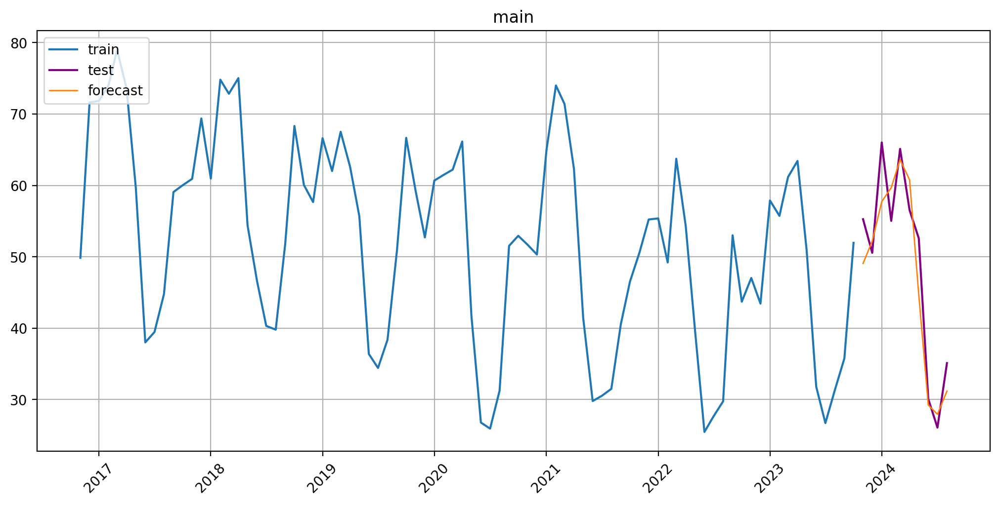

In [66]:
plot_forecast(forecast_ts_hwm,test_ts, train_ts)

In [67]:
mape_hwm = MAPE()
mape_hwm(y_true = test_ts, y_pred=forecast_ts_hwm)

{'main': 8.16743859401335}

In [68]:
smape_hwm = SMAPE()
smape_hwm(y_true = test_ts, y_pred=forecast_ts_hwm)

{'main': 8.42321301112656}

# Predict into the Future

Lastly, let us predict into the future using the exponential smoothing.

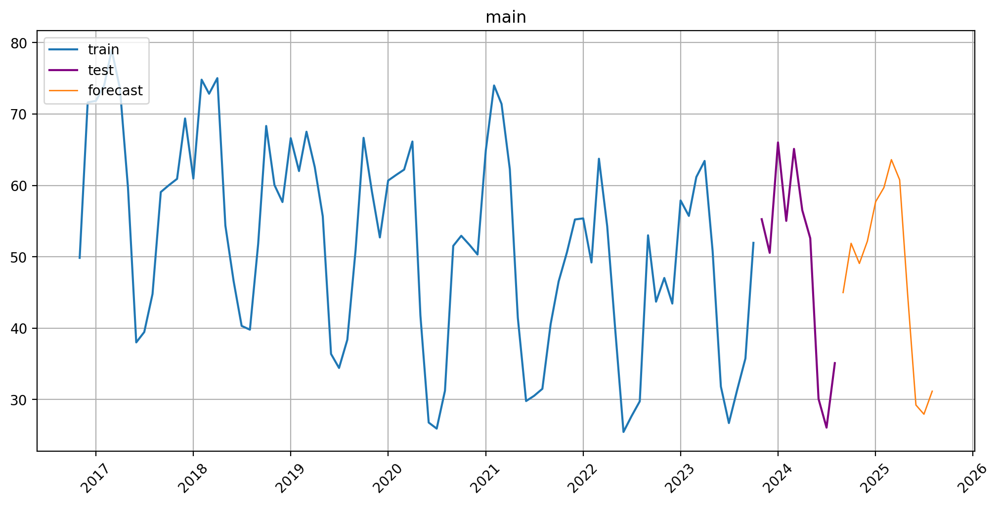

In [69]:
HORIZON = 12 
future = ts.make_future(HORIZON)
forecast = model_hwm.forecast(future)
plot_forecast(forecast,test_ts, train_ts)

In [70]:
forecast_df = forecast.to_pandas()
forecast_2025 = forecast_df.loc["2025"]
forecast_2025.head(12)

segment,main
feature,target
timestamp,
2025-01-01,57.717838
2025-02-01,59.693358
2025-03-01,63.609197
2025-04-01,60.779439
2025-05-01,44.659316
2025-06-01,29.231317
2025-07-01,27.946588
2025-08-01,31.172035


Air quality tends to be worse during the winter and early spring months (January to April, with values between ~57 and ~63), possibly due to weather patterns or increased emissions during these months.

From May to August, the AQI falls into the Good category, indicating that the air quality is satisfactory, with little or no risk to health.

The lowest AQI is observed in July (27.95), suggesting the best air quality during the year.


# Ideas for improving the model

1. use cross-validation choose better parameters for prophet
2. use holiday (create calendar and implement) for prophet
3. try boosting models
4. try neural models, neural prophet
5. make timeseries transformation or  try log transform